# ***Pill Localization and Defect Detection using Multi-Model Instance Segmentation***

Laiba Iqrar     CS-22112

---


Fathima Amna    CS-22156

#MAsk R-CNN BAsed Model Evalaution and Training

In [ ]:
# INSTALL LIBRARIES

!pip install pycocotools -q
!pip install 'git+https://github.com/facebookresearch/detectron2.git' -q

# IMPORTS

import os
import json
import cv2
import zipfile
import numpy as np
from google.colab import drive

from detectron2.data.datasets import register_coco_instances
from detectron2.data import DatasetCatalog, MetadataCatalog
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
from detectron2 import model_zoo

# MOUNT DRIVE

drive.mount('/content/drive')

# UNZIP DATASET

ZIP_PATH = "/content/drive/MyDrive/final_dataset.zip"
EXTRACT_PATH = "/content/FINAL_DATASET"

with zipfile.ZipFile(ZIP_PATH, 'r') as zip_ref:
    zip_ref.extractall(EXTRACT_PATH)

print("Dataset Extracted!")

dataset_path = "/content/FINAL_DATASET/final_dataset"
output_path = "/content/coco_dataset"

os.makedirs(output_path, exist_ok=True)

splits = ["train", "val"]

# COCO CATEGORIES

categories = [
    {"id": 1, "name": "tablet"},
    {"id": 2, "name": "chip"},
    {"id": 3, "name": "cap"},
    {"id": 4, "name": "normal"},
]

# CONVERT YOLO SEGMENTATION TO COCO

for split in splits:

    images_dir = os.path.join(dataset_path, "images", split)
    labels_dir = os.path.join(dataset_path, "labels", split)

    coco = {
        "images": [],
        "annotations": [],
        "categories": categories
    }

    annotation_id = 0
    image_id = 0

    output_images_dir = os.path.join(output_path, "images", split)
    os.makedirs(output_images_dir, exist_ok=True)

    for image_name in os.listdir(images_dir):

        if not image_name.lower().endswith((".jpg", ".png", ".jpeg")):
            continue

        image_path = os.path.join(images_dir, image_name)
        img = cv2.imread(image_path)

        if img is None:
            continue

        height, width = img.shape[:2]

        cv2.imwrite(os.path.join(output_images_dir, image_name), img)

        coco["images"].append({
            "id": image_id,
            "file_name": image_name,
            "height": height,
            "width": width
        })

        label_path = os.path.join(labels_dir, os.path.splitext(image_name)[0] + ".txt")

        if os.path.exists(label_path):

            with open(label_path, "r") as f:
                lines = f.readlines()

            for line in lines:

                parts = line.strip().split()

                class_id = int(parts[0])  # YOLO: 0–3

                coords = list(map(float, parts[1:]))

                polygon = []
                xs, ys = [], []

                for i in range(0, len(coords), 2):
                    x = coords[i] * width
                    y = coords[i + 1] * height

                    polygon.extend([x, y])
                    xs.append(x)
                    ys.append(y)

                if len(xs) == 0:
                    continue

                x_min = min(xs)
                y_min = min(ys)
                bbox_width = max(xs) - x_min
                bbox_height = max(ys) - y_min

                coco["annotations"].append({
                    "id": annotation_id,
                    "image_id": image_id,

                    # FIX: COCO expects 1–4
                    "category_id": class_id + 1,

                    "segmentation": [polygon],
                    "bbox": [x_min, y_min, bbox_width, bbox_height],
                    "area": bbox_width * bbox_height,
                    "iscrowd": 0
                })

                annotation_id += 1

        image_id += 1

    annotations_dir = os.path.join(output_path, "annotations")
    os.makedirs(annotations_dir, exist_ok=True)

    with open(os.path.join(annotations_dir, f"instances_{split}.json"), "w") as f:
        json.dump(coco, f)

print("YOLO → COCO conversion done!")

# RESET REGISTRY

DatasetCatalog.clear()
MetadataCatalog.clear()

# REGISTER DATASETS

thing_classes = ["tablet", "chip", "cap", "normal"]

register_coco_instances(
    "defect_train",
    {"thing_classes": thing_classes},
    "/content/coco_dataset/annotations/instances_train.json",
    "/content/coco_dataset/images/train"
)

register_coco_instances(
    "defect_val",
    {"thing_classes": thing_classes},
    "/content/coco_dataset/annotations/instances_val.json",
    "/content/coco_dataset/images/val"
)

print("Datasets Registered!")

# CONFIGURE MASK R-CNN

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TRAIN = ("defect_train",)
cfg.DATASETS.TEST = ("defect_val",)

cfg.DATALOADER.NUM_WORKERS = 2

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 3000

cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128

# FIX: 4 classes
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.INPUT.MIN_SIZE_TRAIN = (1024,)
cfg.INPUT.MAX_SIZE_TRAIN = 1024

cfg.OUTPUT_DIR = "/content/drive/MyDrive/mask_rcnn_output"

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

print("Configuration Done!")


# TRAIN MODEL

trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

print("Training Finished!")

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.6/94.6 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.5/154.5 kB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 60.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.3/57.3 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.8/269.8 kB 28.0 MB/s eta 0:00:00
Mounted at /content/drive
Dataset Extracted!
YOLO → COCO conversion done!
Datasets Registered!
Configuration Done!
[05/17 14:07:49 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output

model_final_f10217.pkl: 178MB [00:00, 263MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/17 14:07:50 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.12/dist-packages/torch/functional.py:505: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at /pytorch/aten/src/ATen/native/TensorShape.cpp:4381.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]
W0517 14:07:55.057000 1855 torch/fx/_symbolic_trace.py:53] is_fx_tracing will return true for both fx.symbolic_trace and torch.export. Please use is_fx_tracing_symbolic_tracing() for specifically fx.symbolic_trace or torch.compiler.is_compiling() for specifically torch.export/compile.


[05/17 14:08:14 d2.utils.events]:  eta: 0:46:31  iter: 19  total_loss: 2.886  loss_cls: 1.449  loss_box_reg: 0.6728  loss_mask: 0.697  loss_rpn_cls: 0.02994  loss_rpn_loc: 0.0175    time: 1.0031  last_time: 1.0226  data_time: 0.4507  last_data_time: 0.4361   lr: 4.9953e-06  max_mem: 2615M
[05/17 14:08:41 d2.utils.events]:  eta: 0:46:55  iter: 39  total_loss: 2.58  loss_cls: 1.29  loss_box_reg: 0.5418  loss_mask: 0.684  loss_rpn_cls: 0.02494  loss_rpn_loc: 0.01361    time: 1.0099  last_time: 1.5165  data_time: 0.4451  last_data_time: 0.9076   lr: 9.9902e-06  max_mem: 2618M
[05/17 14:09:02 d2.utils.events]:  eta: 0:46:17  iter: 59  total_loss: 2.337  loss_cls: 1.04  loss_box_reg: 0.5615  loss_mask: 0.6606  loss_rpn_cls: 0.02416  loss_rpn_loc: 0.01064    time: 1.0163  last_time: 0.9813  data_time: 0.4660  last_data_time: 0.4431   lr: 1.4985e-05  max_mem: 2618M
[05/17 14:09:22 d2.utils.events]:  eta: 0:45:50  iter: 79  total_loss: 2.03  loss_cls: 0.7339  loss_box_reg: 0.5809  loss_mask: 0.

In [ ]:
edge_cases = []

IOU_FAIL_THR = 0.3

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    gt_boxes = []
    for ann in d["annotations"]:
        seg = ann["segmentation"][0]
        pts = np.array(seg).reshape(-1, 2).astype(np.int32)
        x, y, w, h = cv2.boundingRect(pts)
        gt_boxes.append([x, y, x+w, y+h])

    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy() if len(outputs["instances"]) else []

    # CASE 1: NO DETECTION
    if len(pred_boxes) == 0 and len(gt_boxes) > 0:
        edge_cases.append((d["file_name"], "No detection (false negative)"))
        continue

    # CASE 2: BAD MATCHING
    best_overall_iou = 0

    for pb in pred_boxes:
        for gb in gt_boxes:

            ix1 = max(pb[0], gb[0])
            iy1 = max(pb[1], gb[1])
            ix2 = min(pb[2], gb[2])
            iy2 = min(pb[3], gb[3])

            inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)

            area_pb = (pb[2]-pb[0]) * (pb[3]-pb[1])
            area_gb = (gb[2]-gb[0]) * (gb[3]-gb[1])

            union = area_pb + area_gb - inter

            iou = inter / union if union > 0 else 0

            best_overall_iou = max(best_overall_iou, iou)

    if best_overall_iou < IOU_FAIL_THR:
        edge_cases.append((d["file_name"], f"Low IoU ({best_overall_iou:.2f})"))

In [ ]:
cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/mask_rcnn_output/model_final.pth"
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

In [ ]:
trainer = Trainer(cfg)
trainer.resume_or_load(resume=False)

trainer.test(cfg, trainer.model)

[05/17 15:01:10 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

OrderedDict([('bbox',
              {'AP': 55.65199739102776,
               'AP50': 74.78811204020413,
               'AP75': 58.21782178217821,
               'APs': nan,
               'APm': 25.04950495049505,
               'APl': 55.87975296733727,
               'AP-tablet': 92.39865136810319,
               'AP-chip': 38.818290005692305,
               'AP-cap': 14.165825668063354,
               'AP-normal': 77.22522252225222}),
             ('segm',
              {'AP': 61.764466015121236,
               'AP50': 80.75584205921699,
               'AP75': 56.71747437901685,
               'APs': nan,
               'APm': 25.04950495049505,
               'APl': 61.96278227531867,
               'AP-tablet': 99.24917491749174,
               'AP-chip': 33.964053548211965,
               'AP-cap': 29.240675198741595,
               'AP-normal': 84.6039603960396})])

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class Trainer(DefaultTrainer):
    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        if output_folder is None:
            output_folder = cfg.OUTPUT_DIR
        return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TRAIN = ("defect_train",)
cfg.DATASETS.TEST = ("defect_val",)

cfg.DATALOADER.NUM_WORKERS = 2

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)

# =========================
# RUN 2 CHANGES
# =========================

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.0001
cfg.SOLVER.MAX_ITER = 3000

cfg.SOLVER.OPTIMIZER = "ADAMW"

# Freeze early backbone layers
cfg.MODEL.BACKBONE.FREEZE_AT = 2

# =========================
# MODEL HEAD
# =========================
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

# =========================
# INPUT
# =========================
cfg.INPUT.MIN_SIZE_TRAIN = (1024,)
cfg.INPUT.MAX_SIZE_TRAIN = 1024

# =========================
# OUTPUT
# =========================
cfg.OUTPUT_DIR = "/content/drive/MyDrive/mask_rcnn_run2"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

print("Run 2 Config Ready")

Run 2 Config Ready


In [ ]:
trainer = Trainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/17 15:02:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/17 15:02:01 d2.engine.train_loop]: Starting training from iteration 0
[05/17 15:02:36 d2.utils.events]:  eta: 1:21:59  iter: 19  total_loss: 3.207  loss_cls: 1.505  loss_box_reg: 0.9235  loss_mask: 0.6932  loss_rpn_cls: 0.03126  loss_rpn_loc: 0.01746    time: 1.7243  last_time: 0.9498  data_time: 1.0286  last_data_time: 0.3216   lr: 1.9981e-06  max_mem: 2785M
[05/17 15:02:56 d2.utils.events]:  eta: 0:59:17  iter: 39  total_loss: 3.084  loss_cls: 1.461  loss_box_reg: 0.8492  loss_mask: 0.6865  loss_rpn_cls: 0.03221  loss_rpn_loc: 0.01356    time: 1.3325  last_time: 0.8929  data_time: 0.3659  last_data_time: 0.2935   lr: 3.9961e-06  max_mem: 2785M
[05/17 15:03:16 d2.utils.events]:  eta: 0:47:19  iter: 59  total_loss: 3.039  loss_cls: 1.35  loss_box_reg: 0.914  loss_mask: 0.6766  loss_rpn_cls: 0.02979  loss_rpn_loc: 0.0112    time: 1.2180  last_time: 0.9137  data_time: 0.3943  last_data_time: 0.2660   lr: 5.9941e-06  max_mem: 2785M
[05/17 15:03:38 d2.utils.events]:  eta: 0:47:40  iter

In [ ]:
cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TRAIN = ("defect_train",)
cfg.DATASETS.TEST = ("defect_val",)

cfg.DATALOADER.NUM_WORKERS = 2

cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(
    "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
)

# =========================
# RUN 3 CHANGES
# =========================

cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 300

cfg.SOLVER.OPTIMIZER = "SGD"
cfg.SOLVER.MOMENTUM = 0.9

# Cosine schedule (important for report)
cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupCosineLR"

# =========================
# MODEL HEAD
# =========================
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

# =========================
# INPUT
# =========================
cfg.INPUT.MIN_SIZE_TRAIN = (1024,)
cfg.INPUT.MAX_SIZE_TRAIN = 1024

# =========================
# OUTPUT
# =========================
cfg.OUTPUT_DIR = "/content/drive/MyDrive/mask_rcnn_run3"
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

print("Run 3 Config Ready")

Run 3 Config Ready


In [ ]:
trainer = Trainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/17 15:54:23 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}
roi_heads.mask_head.predictor.{bias, weight}


[05/17 15:54:23 d2.engine.train_loop]: Starting training from iteration 0
[05/17 15:54:34 d2.utils.events]:  eta: 0:20:30  iter: 19  total_loss: 3.094  loss_cls: 1.541  loss_box_reg: 0.7884  loss_mask: 0.6976  loss_rpn_cls: 0.01916  loss_rpn_loc: 0.01397    time: 0.5143  last_time: 0.3807  data_time: 0.1942  last_data_time: 0.0009   lr: 3.8077e-06  max_mem: 3077M
[05/17 15:54:44 d2.utils.events]:  eta: 0:21:04  iter: 39  total_loss: 2.796  loss_cls: 1.449  loss_box_reg: 0.6206  loss_mask: 0.6892  loss_rpn_cls: 0.01495  loss_rpn_loc: 0.01358    time: 0.4984  last_time: 0.4173  data_time: 0.1417  last_data_time: 0.0652   lr: 7.5527e-06  max_mem: 3077M
[05/17 15:54:54 d2.utils.events]:  eta: 0:22:41  iter: 59  total_loss: 2.519  loss_cls: 1.188  loss_box_reg: 0.5692  loss_mask: 0.6675  loss_rpn_cls: 0.009564  loss_rpn_loc: 0.01039    time: 0.5060  last_time: 0.3408  data_time: 0.1738  last_data_time: 0.0078   lr: 1.1298e-05  max_mem: 3077M
[05/17 15:55:04 d2.utils.events]:  eta: 0:22:09  

[05/17 16:20:22 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_output/model_final.pth ...
Model Loaded!

COCO EVALUATION
WARNING [05/17 16:20:22 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/17 16:20:22 d2.data.datasets.coco]: Loaded 67 images in COCO format from /content/coco_dataset/annotations/instances_val.json
[05/17 16:20:22 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1024, 1024), max_size=1024, sample_style='choice')]
[05/17 16:20:22 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/17 16:20:22 d2.data.common]: Serializing 67 elements to byte tensors and concatenating them all ...
[05/17 16:20:22 d2.data.common]: Serialized dataset takes 0.05 MiB
[05/17 16:20:22 d2.evaluation.evaluator]: Start inference on 67

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


[05/17 16:20:30 d2.evaluation.evaluator]: Inference done 11/67. Dataloading: 0.0034 s/iter. Inference: 0.1506 s/iter. Eval: 0.3041 s/iter. Total: 0.4582 s/iter. ETA=0:00:25
[05/17 16:20:36 d2.evaluation.evaluator]: Inference done 19/67. Dataloading: 0.0039 s/iter. Inference: 0.1553 s/iter. Eval: 0.4448 s/iter. Total: 0.6044 s/iter. ETA=0:00:29
[05/17 16:20:41 d2.evaluation.evaluator]: Inference done 31/67. Dataloading: 0.0083 s/iter. Inference: 0.1548 s/iter. Eval: 0.3614 s/iter. Total: 0.5248 s/iter. ETA=0:00:18
[05/17 16:20:47 d2.evaluation.evaluator]: Inference done 42/67. Dataloading: 0.0070 s/iter. Inference: 0.1530 s/iter. Eval: 0.3629 s/iter. Total: 0.5232 s/iter. ETA=0:00:13
[05/17 16:20:52 d2.evaluation.evaluator]: Inference done 50/67. Dataloading: 0.0067 s/iter. Inference: 0.1557 s/iter. Eval: 0.3803 s/iter. Total: 0.5431 s/iter. ETA=0:00:09
[05/17 16:20:58 d2.evaluation.evaluator]: Inference done 61/67. Dataloading: 0.0059 s/iter. Inference: 0.1527 s/iter. Eval: 0.3734 s/it

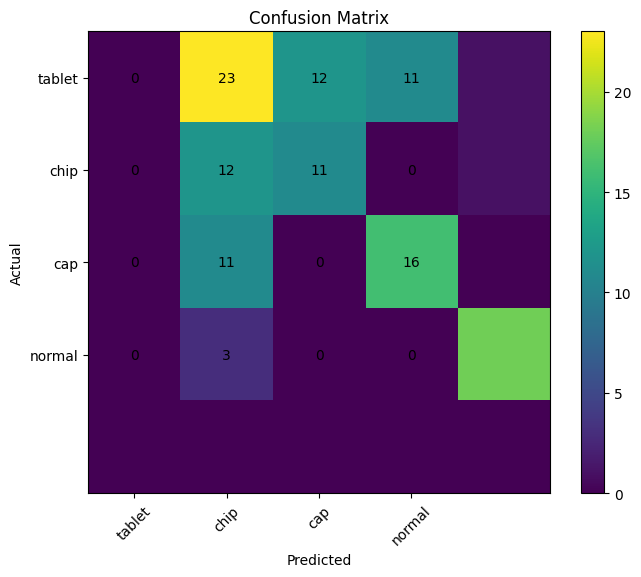


PRECISION-RECALL CURVE


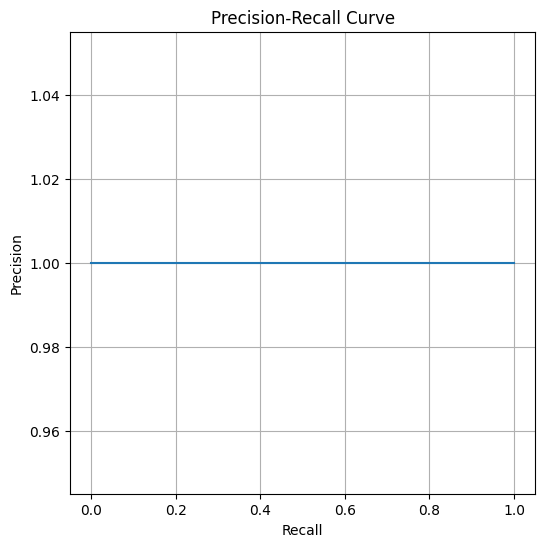


INFERENCE LATENCY
Average Inference Time: 0.2421319842338562 seconds
FPS: 4.129978958228744

EVALUATION COMPLETE


In [ ]:
# =========================================================
# COMPLETE MASK R-CNN EVALUATION PIPELINE
# - mAP
# - mIoU
# - Confusion Matrix
# - Precision-Recall Curve
# - Inference Latency
# =========================================================

import os
import cv2
import time
import torch
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve

from detectron2.config import get_cfg
from detectron2 import model_zoo

from detectron2.engine import DefaultPredictor
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
    build_detection_test_loader
)

from detectron2.evaluation import (
    COCOEvaluator,
    inference_on_dataset
)

# =========================================================
# SELECT MODEL TO EVALUATE
# =========================================================

MODEL_PATH = "/content/drive/MyDrive/mask_rcnn_output/model_final.pth"

# change to:
# /content/mask_rcnn_run2/model_final.pth
# /content/mask_rcnn_run3/model_final.pth

# =========================================================
# CONFIG
# =========================================================

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TEST = ("defect_val",)

cfg.MODEL.WEIGHTS = MODEL_PATH

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.INPUT.MIN_SIZE_TEST = 1024
cfg.INPUT.MAX_SIZE_TEST = 1024

# =========================================================
# LOAD PREDICTOR
# =========================================================

predictor = DefaultPredictor(cfg)

print("Model Loaded!")

# =========================================================
# 1. COCO EVALUATION (mAP)
# =========================================================

print("\n==============================")
print("COCO EVALUATION")
print("==============================")

evaluator = COCOEvaluator(
    "defect_val",
    cfg,
    False,
    output_dir="./output/"
)

val_loader = build_detection_test_loader(
    cfg,
    "defect_val"
)

results = inference_on_dataset(
    predictor.model,
    val_loader,
    evaluator
)

print(results)

# =========================================================
# 2. mIoU CALCULATION
# =========================================================

print("\n==============================")
print("mIoU CALCULATION")
print("==============================")

dataset_dicts = DatasetCatalog.get("defect_val")

ious = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])

    outputs = predictor(img)

    pred_masks = outputs["instances"].pred_masks.cpu().numpy()

    if len(pred_masks) == 0:
        continue

    pred_mask = np.any(pred_masks, axis=0)

    gt_mask = np.zeros(pred_mask.shape, dtype=np.uint8)

    for ann in d["annotations"]:

        seg = ann["segmentation"][0]

        pts = np.array(seg).reshape(-1, 2).astype(np.int32)

        cv2.fillPoly(gt_mask, [pts], 1)

    intersection = np.logical_and(pred_mask, gt_mask).sum()

    union = np.logical_or(pred_mask, gt_mask).sum()

    if union > 0:

        iou = intersection / union

        ious.append(iou)

miou = np.mean(ious)

print("Mean IoU:", miou)

# =========================================================
# 3. CONFUSION MATRIX
# =========================================================

print("\n==============================")
print("CONFUSION MATRIX")
print("==============================")

y_true = []
y_pred = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])

    outputs = predictor(img)

    pred_classes = outputs["instances"].pred_classes.cpu().numpy()

    gt_classes = [
        ann["category_id"] - 1
        for ann in d["annotations"]
    ]

    min_len = min(
        len(gt_classes),
        len(pred_classes)
    )

    y_true.extend(gt_classes[:min_len])

    y_pred.extend(pred_classes[:min_len])

cm = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(8, 6))

plt.imshow(cm)

plt.colorbar()

classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]

plt.xticks(
    range(len(classes)),
    classes,
    rotation=45
)

plt.yticks(
    range(len(classes)),
    classes
)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

for i in range(len(classes)):
    for j in range(len(classes)):

        plt.text(
            j,
            i,
            cm[i, j],
            ha='center',
            va='center'
        )

plt.show()

# =========================================================
# 4. PRECISION-RECALL CURVE
# =========================================================

print("\n==============================")
print("PRECISION-RECALL CURVE")
print("==============================")

scores = []
labels = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])

    outputs = predictor(img)

    instances = outputs["instances"]

    if len(instances) == 0:
        continue

    pred_scores = instances.scores.cpu().numpy()

    for s in pred_scores:

        scores.append(s)

        labels.append(1)

precision, recall, _ = precision_recall_curve(
    labels,
    scores
)

plt.figure(figsize=(6,6))

plt.plot(
    recall,
    precision
)

plt.xlabel("Recall")

plt.ylabel("Precision")

plt.title("Precision-Recall Curve")

plt.grid()

plt.show()

# =========================================================
# 5. INFERENCE LATENCY
# =========================================================

print("\n==============================")
print("INFERENCE LATENCY")
print("==============================")

times = []

for d in dataset_dicts[:20]:

    img = cv2.imread(d["file_name"])

    start = time.time()

    outputs = predictor(img)

    end = time.time()

    times.append(end - start)

avg_latency = np.mean(times)

fps = 1 / avg_latency

print("Average Inference Time:", avg_latency, "seconds")

print("FPS:", fps)

print("\n==============================")
print("EVALUATION COMPLETE")
print("==============================")

In [ ]:
# =========================================================
# COMPLETE MASK R-CNN EVALUATION PIPELINE
# - mAP
# - mIoU
# - Confusion Matrix
# - Precision-Recall Curve
# - Inference Latency
# =========================================================

import os
import cv2
import time
import torch
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve

from detectron2.config import get_cfg
from detectron2 import model_zoo

from detectron2.engine import DefaultPredictor
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
    build_detection_test_loader
)

from detectron2.evaluation import (
    COCOEvaluator,
    inference_on_dataset
)

# =========================================================
# SELECT MODEL TO EVALUATE
# =========================================================

MODEL_PATH = "/content/mask_rcnn_run2/model_final.pth"

# change to:
# /content/mask_rcnn_run2/model_final.pth
# /content/mask_rcnn_run3/model_final.pth

# =========================================================
# CONFIG
# =========================================================

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TEST = ("defect_val",)

cfg.MODEL.WEIGHTS = MODEL_PATH

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.INPUT.MIN_SIZE_TEST = 1024
cfg.INPUT.MAX_SIZE_TEST = 1024

# =========================================================
# LOAD PREDICTOR
# =========================================================

predictor = DefaultPredictor(cfg)

print("Model Loaded!")

# =========================================================
# 1. COCO EVALUATION (mAP)
# =========================================================

print("\n==============================")
print("COCO EVALUATION")
print("==============================")

evaluator = COCOEvaluator(
    "defect_val",
    cfg,
    False,
    output_dir="./output/"
)

val_loader = build_detection_test_loader(
    cfg,
    "defect_val"
)

results = inference_on_dataset(
    predictor.model,
    val_loader,
    evaluator
)

print(results)

# =========================================================
# 2. mIoU CALCULATION
# =========================================================

print("\n==============================")
print("mIoU CALCULATION")
print("==============================")

dataset_dicts = DatasetCatalog.get("defect_val")

ious = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])

    outputs = predictor(img)

    pred_masks = outputs["instances"].pred_masks.cpu().numpy()

    if len(pred_masks) == 0:
        continue

    pred_mask = np.any(pred_masks, axis=0)

    gt_mask = np.zeros(pred_mask.shape, dtype=np.uint8)

    for ann in d["annotations"]:

        seg = ann["segmentation"][0]

        pts = np.array(seg).reshape(-1, 2).astype(np.int32)

        cv2.fillPoly(gt_mask, [pts], 1)

    intersection = np.logical_and(pred_mask, gt_mask).sum()

    union = np.logical_or(pred_mask, gt_mask).sum()

    if union > 0:

        iou = intersection / union

        ious.append(iou)

miou = np.mean(ious)

print("Mean IoU:", miou)

# =========================================================
# 3. CONFUSION MATRIX
# =========================================================

print("\n==============================")
print("CONFUSION MATRIX")
print("==============================")

y_true = []
y_pred = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])

    outputs = predictor(img)

    pred_classes = outputs["instances"].pred_classes.cpu().numpy()

    gt_classes = [
        ann["category_id"] - 1
        for ann in d["annotations"]
    ]

    min_len = min(
        len(gt_classes),
        len(pred_classes)
    )

    y_true.extend(gt_classes[:min_len])

    y_pred.extend(pred_classes[:min_len])

cm = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(8, 6))

plt.imshow(cm)

plt.colorbar()

classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]

plt.xticks(
    range(len(classes)),
    classes,
    rotation=45
)

plt.yticks(
    range(len(classes)),
    classes
)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

for i in range(len(classes)):
    for j in range(len(classes)):

        plt.text(
            j,
            i,
            cm[i, j],
            ha='center',
            va='center'
        )

plt.show()


# =========================================================
# 5. INFERENCE LATENCY
# =========================================================

print("\n==============================")
print("INFERENCE LATENCY")
print("==============================")

times = []

for d in dataset_dicts[:20]:

    img = cv2.imread(d["file_name"])

    start = time.time()

    outputs = predictor(img)

    end = time.time()

    times.append(end - start)

avg_latency = np.mean(times)

fps = 1 / avg_latency

print("Average Inference Time:", avg_latency, "seconds")

print("FPS:", fps)

print("\n==============================")
print("EVALUATION COMPLETE")
print("==============================")

[05/17 17:29:29 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...
Model Loaded!

COCO EVALUATION
WARNING [05/17 17:29:29 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/17 17:29:29 d2.data.datasets.coco]: Loaded 67 images in COCO format from /content/coco_dataset/annotations/instances_val.json
[05/17 17:29:29 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1024, 1024), max_size=1024, sample_style='choice')]
[05/17 17:29:29 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/17 17:29:29 d2.data.common]: Serializing 67 elements to byte tensors and concatenating them all ...
[05/17 17:29:29 d2.data.common]: Serialized dataset takes 0.05 MiB
[05/17 17:29:29 d2.evaluation.evaluator]: Start inference on 67 b

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


[05/17 17:29:37 d2.evaluation.evaluator]: Inference done 11/67. Dataloading: 0.0480 s/iter. Inference: 0.1412 s/iter. Eval: 0.3265 s/iter. Total: 0.5158 s/iter. ETA=0:00:28
[05/17 17:29:43 d2.evaluation.evaluator]: Inference done 18/67. Dataloading: 0.0253 s/iter. Inference: 0.1481 s/iter. Eval: 0.4941 s/iter. Total: 0.6678 s/iter. ETA=0:00:32
[05/17 17:29:48 d2.evaluation.evaluator]: Inference done 30/67. Dataloading: 0.0149 s/iter. Inference: 0.1483 s/iter. Eval: 0.3928 s/iter. Total: 0.5564 s/iter. ETA=0:00:20
[05/17 17:29:53 d2.evaluation.evaluator]: Inference done 39/67. Dataloading: 0.0119 s/iter. Inference: 0.1500 s/iter. Eval: 0.3966 s/iter. Total: 0.5588 s/iter. ETA=0:00:15
[05/17 17:29:59 d2.evaluation.evaluator]: Inference done 49/67. Dataloading: 0.0106 s/iter. Inference: 0.1533 s/iter. Eval: 0.3981 s/iter. Total: 0.5623 s/iter. ETA=0:00:10
[05/17 17:30:04 d2.evaluation.evaluator]: Inference done 58/67. Dataloading: 0.0094 s/iter. Inference: 0.1531 s/iter. Eval: 0.4043 s/it

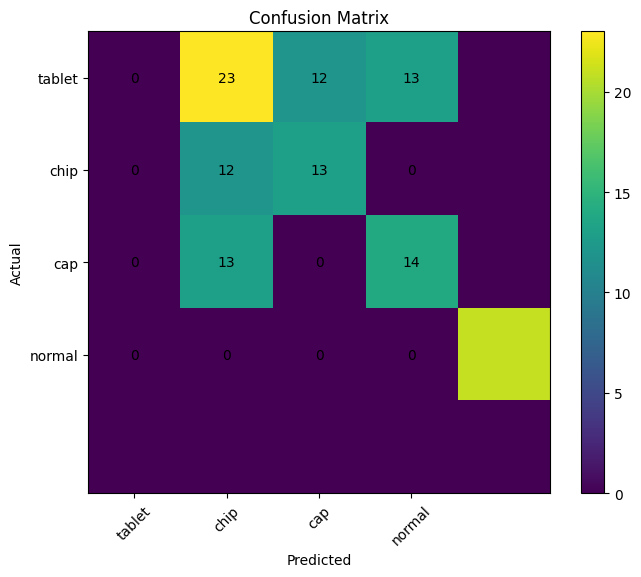


INFERENCE LATENCY
Average Inference Time: 0.22145043611526488 seconds
FPS: 4.515683136787775

EVALUATION COMPLETE


In [ ]:
# =========================================================
# COMPLETE MASK R-CNN EVALUATION PIPELINE
# - mAP
# - mIoU
# - Confusion Matrix
# - Precision-Recall Curve
# - Inference Latency
# =========================================================

import os
import cv2
import time
import torch
import numpy as np
import matplotlib.pyplot as plt

from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_recall_curve

from detectron2.config import get_cfg
from detectron2 import model_zoo

from detectron2.engine import DefaultPredictor
from detectron2.data import (
    DatasetCatalog,
    MetadataCatalog,
    build_detection_test_loader
)

from detectron2.evaluation import (
    COCOEvaluator,
    inference_on_dataset
)

# =========================================================
# SELECT MODEL TO EVALUATE
# =========================================================

MODEL_PATH = "/content/mask_rcnn_run3/model_final.pth"

# change to:
# /content/mask_rcnn_run2/model_final.pth
# /content/mask_rcnn_run3/model_final.pth

# =========================================================
# CONFIG
# =========================================================

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.DATASETS.TEST = ("defect_val",)

cfg.MODEL.WEIGHTS = MODEL_PATH

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.INPUT.MIN_SIZE_TEST = 1024
cfg.INPUT.MAX_SIZE_TEST = 1024

# =========================================================
# LOAD PREDICTOR
# =========================================================

predictor = DefaultPredictor(cfg)

print("Model Loaded!")

# =========================================================
# 1. COCO EVALUATION (mAP)
# =========================================================

print("\n==============================")
print("COCO EVALUATION")
print("==============================")

evaluator = COCOEvaluator(
    "defect_val",
    cfg,
    False,
    output_dir="./output/"
)

val_loader = build_detection_test_loader(
    cfg,
    "defect_val"
)

results = inference_on_dataset(
    predictor.model,
    val_loader,
    evaluator
)

print(results)

# =========================================================
# 2. mIoU CALCULATION
# =========================================================

print("\n==============================")
print("mIoU CALCULATION")
print("==============================")

dataset_dicts = DatasetCatalog.get("defect_val")

ious = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])

    outputs = predictor(img)

    pred_masks = outputs["instances"].pred_masks.cpu().numpy()

    if len(pred_masks) == 0:
        continue

    pred_mask = np.any(pred_masks, axis=0)

    gt_mask = np.zeros(pred_mask.shape, dtype=np.uint8)

    for ann in d["annotations"]:

        seg = ann["segmentation"][0]

        pts = np.array(seg).reshape(-1, 2).astype(np.int32)

        cv2.fillPoly(gt_mask, [pts], 1)

    intersection = np.logical_and(pred_mask, gt_mask).sum()

    union = np.logical_or(pred_mask, gt_mask).sum()

    if union > 0:

        iou = intersection / union

        ious.append(iou)

miou = np.mean(ious)

print("Mean IoU:", miou)

# =========================================================
# 3. CONFUSION MATRIX
# =========================================================

print("\n==============================")
print("CONFUSION MATRIX")
print("==============================")

y_true = []
y_pred = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])

    outputs = predictor(img)

    pred_classes = outputs["instances"].pred_classes.cpu().numpy()

    gt_classes = [
        ann["category_id"] - 1
        for ann in d["annotations"]
    ]

    min_len = min(
        len(gt_classes),
        len(pred_classes)
    )

    y_true.extend(gt_classes[:min_len])

    y_pred.extend(pred_classes[:min_len])

cm = confusion_matrix(
    y_true,
    y_pred
)

plt.figure(figsize=(8, 6))

plt.imshow(cm)

plt.colorbar()

classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]

plt.xticks(
    range(len(classes)),
    classes,
    rotation=45
)

plt.yticks(
    range(len(classes)),
    classes
)

plt.xlabel("Predicted")

plt.ylabel("Actual")

plt.title("Confusion Matrix")

for i in range(len(classes)):
    for j in range(len(classes)):

        plt.text(
            j,
            i,
            cm[i, j],
            ha='center',
            va='center'
        )

plt.show()


# =========================================================
# 5. INFERENCE LATENCY
# =========================================================

print("\n==============================")
print("INFERENCE LATENCY")
print("==============================")

times = []

for d in dataset_dicts[:20]:

    img = cv2.imread(d["file_name"])

    start = time.time()

    outputs = predictor(img)

    end = time.time()

    times.append(end - start)

avg_latency = np.mean(times)

fps = 1 / avg_latency

print("Average Inference Time:", avg_latency, "seconds")

print("FPS:", fps)

print("\n==============================")
print("EVALUATION COMPLETE")
print("==============================")

In [ ]:
models = {
    "Run1_SGD": "/content/drive/MyDrive/mask_rcnn_output/model_final.pth",
    "Run2_AdamW": "/content/drive/MyDrive/mask_rcnn_run2/model_final.pth",
    "Run3_CosineSGD": "/content/drive/MyDrive/mask_rcnn_run3/model_final.pth"
}

In [ ]:
from detectron2.engine import DefaultPredictor
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
from detectron2 import model_zoo
from detectron2.config import get_cfg
import time
import numpy as np
import cv2
from detectron2.data import DatasetCatalog


def compute_iou(pred_mask, gt_mask):

    intersection = np.logical_and(pred_mask, gt_mask).sum()
    union = np.logical_or(pred_mask, gt_mask).sum()

    if union == 0:
        return 0

    return intersection / union


def compute_miou(predictor, dataset_dicts):

    ious = []

    for d in dataset_dicts:

        img = cv2.imread(d["file_name"])
        outputs = predictor(img)

        pred_masks = outputs["instances"].pred_masks.cpu().numpy()

        if len(pred_masks) == 0:
            continue

        # merge all predicted instances into one mask
        pred_mask = np.any(pred_masks, axis=0)

        gt_mask = np.zeros(pred_mask.shape, dtype=np.uint8)

        for ann in d["annotations"]:

            seg = ann["segmentation"][0]
            pts = np.array(seg).reshape(-1, 2).astype(np.int32)

            cv2.fillPoly(gt_mask, [pts], 1)

        ious.append(compute_iou(pred_mask, gt_mask))

    return np.mean(ious)

results_summary = {}

def build_cfg(model_path):

    cfg = get_cfg()

    cfg.merge_from_file(
        model_zoo.get_config_file(
            "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
        )
    )

    cfg.MODEL.WEIGHTS = model_path
    cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

    cfg.DATASETS.TEST = ("defect_val",)

    cfg.INPUT.MIN_SIZE_TEST = 1024
    cfg.INPUT.MAX_SIZE_TEST = 1024

    return cfg


def evaluate_model(name, path):

    cfg = build_cfg(path)

    predictor = DefaultPredictor(cfg)

    evaluator = COCOEvaluator("defect_val", cfg, False, output_dir="./cmp/")
    val_loader = build_detection_test_loader(cfg, "defect_val")

    coco_result = inference_on_dataset(
        predictor.model,
        val_loader,
        evaluator
    )

    dataset_dicts = DatasetCatalog.get("defect_val")

    # =========================
    # LATENCY
    # =========================
    times = []
    for d in dataset_dicts[:20]:
        img = cv2.imread(d["file_name"])

        start = time.time()
        predictor(img)
        end = time.time()

        times.append(end - start)

    latency = np.mean(times)

    # =========================
    # mIoU (NEW)
    # =========================
    miou = compute_miou(predictor, dataset_dicts)

    return {
        "coco": coco_result,
        "latency": latency,
        "miou": miou   # ✅ NOW INCLUDED
    }

In [ ]:
for name, path in models.items():

    print(f"\n==============================")
    print(f"Evaluating {name}")
    print(f"==============================")

    results_summary[name] = evaluate_model(name, path)


Evaluating Run1_SGD
[05/17 16:24:38 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_output/model_final.pth ...
WARNING [05/17 16:24:39 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[05/17 16:24:39 d2.data.datasets.coco]: Loaded 67 images in COCO format from /content/coco_dataset/annotations/instances_val.json
[05/17 16:24:39 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(1024, 1024), max_size=1024, sample_style='choice')]
[05/17 16:24:39 d2.data.common]: Serializing the dataset using: <class 'detectron2.data.common._TorchSerializedList'>
[05/17 16:24:39 d2.data.common]: Serializing 67 elements to byte tensors and concatenating them all ...
[05/17 16:24:39 d2.data.common]: Serialized dataset takes 0.05 MiB
[05/17 16:24:39 d2.evaluation.evaluator]: Start inference on 67 batches


/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


[05/17 16:24:49 d2.evaluation.evaluator]: Inference done 11/67. Dataloading: 0.0625 s/iter. Inference: 0.1623 s/iter. Eval: 0.4985 s/iter. Total: 0.7234 s/iter. ETA=0:00:40
[05/17 16:24:54 d2.evaluation.evaluator]: Inference done 22/67. Dataloading: 0.0255 s/iter. Inference: 0.1517 s/iter. Eval: 0.3882 s/iter. Total: 0.5657 s/iter. ETA=0:00:25
[05/17 16:25:00 d2.evaluation.evaluator]: Inference done 32/67. Dataloading: 0.0177 s/iter. Inference: 0.1554 s/iter. Eval: 0.4045 s/iter. Total: 0.5781 s/iter. ETA=0:00:20
[05/17 16:25:06 d2.evaluation.evaluator]: Inference done 41/67. Dataloading: 0.0143 s/iter. Inference: 0.1555 s/iter. Eval: 0.4144 s/iter. Total: 0.5845 s/iter. ETA=0:00:15
[05/17 16:25:12 d2.evaluation.evaluator]: Inference done 52/67. Dataloading: 0.0119 s/iter. Inference: 0.1559 s/iter. Eval: 0.4041 s/iter. Total: 0.5723 s/iter. ETA=0:00:08
[05/17 16:25:17 d2.evaluation.evaluator]: Inference done 60/67. Dataloading: 0.0109 s/iter. Inference: 0.1582 s/iter. Eval: 0.4232 s/it

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


[05/17 16:26:06 d2.evaluation.evaluator]: Inference done 11/67. Dataloading: 0.0038 s/iter. Inference: 0.1508 s/iter. Eval: 0.3543 s/iter. Total: 0.5089 s/iter. ETA=0:00:28
[05/17 16:26:11 d2.evaluation.evaluator]: Inference done 19/67. Dataloading: 0.0034 s/iter. Inference: 0.1502 s/iter. Eval: 0.4427 s/iter. Total: 0.5967 s/iter. ETA=0:00:28
[05/17 16:26:16 d2.evaluation.evaluator]: Inference done 27/67. Dataloading: 0.0048 s/iter. Inference: 0.1565 s/iter. Eval: 0.4489 s/iter. Total: 0.6106 s/iter. ETA=0:00:24
[05/17 16:26:22 d2.evaluation.evaluator]: Inference done 37/67. Dataloading: 0.0045 s/iter. Inference: 0.1532 s/iter. Eval: 0.4367 s/iter. Total: 0.5949 s/iter. ETA=0:00:17
[05/17 16:26:27 d2.evaluation.evaluator]: Inference done 45/67. Dataloading: 0.0046 s/iter. Inference: 0.1550 s/iter. Eval: 0.4419 s/iter. Total: 0.6019 s/iter. ETA=0:00:13
[05/17 16:26:32 d2.evaluation.evaluator]: Inference done 52/67. Dataloading: 0.0046 s/iter. Inference: 0.1577 s/iter. Eval: 0.4626 s/it

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:424: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()
/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:432: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  self.check_worker_number_rationality()


[05/17 16:27:27 d2.evaluation.evaluator]: Inference done 11/67. Dataloading: 0.0028 s/iter. Inference: 0.1688 s/iter. Eval: 0.5732 s/iter. Total: 0.7449 s/iter. ETA=0:00:41
[05/17 16:27:32 d2.evaluation.evaluator]: Inference done 21/67. Dataloading: 0.0037 s/iter. Inference: 0.1520 s/iter. Eval: 0.4464 s/iter. Total: 0.6024 s/iter. ETA=0:00:27
[05/17 16:27:38 d2.evaluation.evaluator]: Inference done 31/67. Dataloading: 0.0040 s/iter. Inference: 0.1539 s/iter. Eval: 0.4515 s/iter. Total: 0.6099 s/iter. ETA=0:00:21
[05/17 16:27:44 d2.evaluation.evaluator]: Inference done 40/67. Dataloading: 0.0040 s/iter. Inference: 0.1524 s/iter. Eval: 0.4458 s/iter. Total: 0.6025 s/iter. ETA=0:00:16
[05/17 16:27:49 d2.evaluation.evaluator]: Inference done 51/67. Dataloading: 0.0039 s/iter. Inference: 0.1503 s/iter. Eval: 0.4206 s/iter. Total: 0.5751 s/iter. ETA=0:00:09
[05/17 16:27:55 d2.evaluation.evaluator]: Inference done 58/67. Dataloading: 0.0039 s/iter. Inference: 0.1518 s/iter. Eval: 0.4498 s/it

In [ ]:
import pandas as pd

table = []

for name, res in results_summary.items():

    coco = res["coco"]

    # detect correct structure safely
    segm = coco.get("segm", None)

    if segm is None:
        segm = coco.get("segmentation", {})

    table.append({
        "Model": name,
        "mAP": segm.get("AP", None),
        "AP50": segm.get("AP50", None),
        "AP75": segm.get("AP75", None),
        "mIoU": res.get("miou", None),
        "Latency (s)": res.get("latency", None)
    })

df = pd.DataFrame(table)

df

,Model,mAP,AP50,AP75,mIoU,Latency (s)
0,Run1_SGD,64.461541,87.266561,59.420717,0.966337,0.247410
1,Run2_AdamW,62.286416,84.477643,58.847674,0.965496,0.256357
2,Run3_CosineSGD,64.456805,86.505021,57.336424,0.967143,0.230961


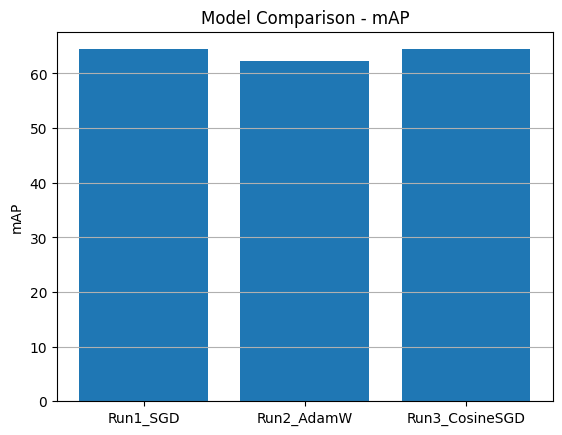

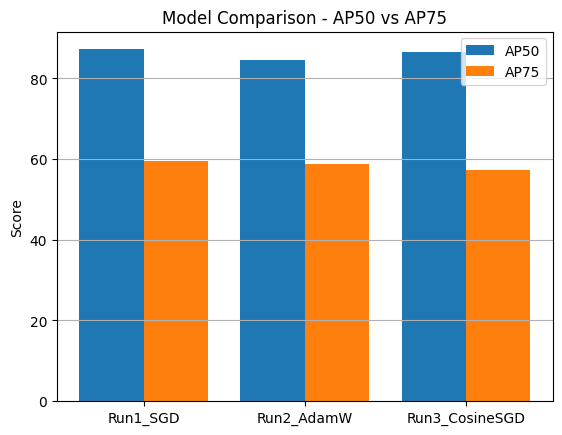

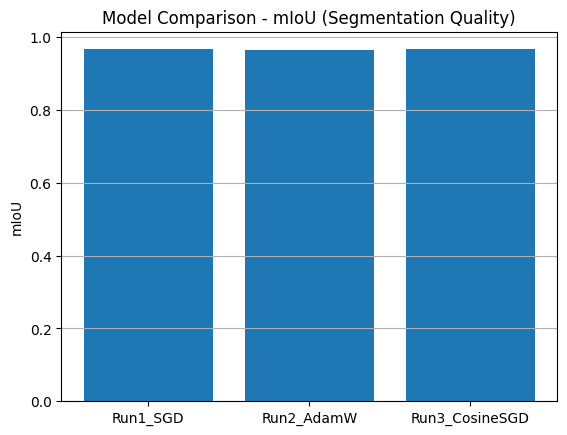

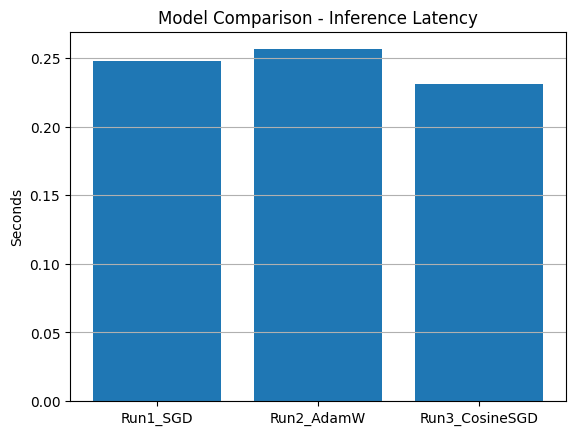

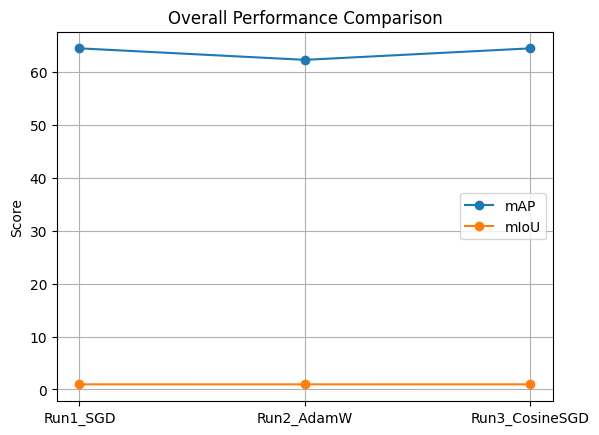

In [ ]:
import matplotlib.pyplot as plt

# =========================================================
# 1. mAP Comparison
# =========================================================
plt.figure()

plt.bar(df["Model"], df["mAP"])
plt.title("Model Comparison - mAP")
plt.ylabel("mAP")
plt.grid(axis="y")
plt.show()

# =========================================================
# 2. AP50 & AP75 Comparison
# =========================================================
plt.figure()

x = range(len(df["Model"]))

plt.bar(x, df["AP50"], width=0.4, label="AP50")
plt.bar([i + 0.4 for i in x], df["AP75"], width=0.4, label="AP75")

plt.xticks([i + 0.2 for i in x], df["Model"])

plt.title("Model Comparison - AP50 vs AP75")
plt.ylabel("Score")
plt.legend()
plt.grid(axis="y")
plt.show()

# =========================================================
# 3. mIoU Comparison (VERY IMPORTANT FOR YOUR PROJECT)
# =========================================================
plt.figure()

plt.bar(df["Model"], df["mIoU"])
plt.title("Model Comparison - mIoU (Segmentation Quality)")
plt.ylabel("mIoU")
plt.grid(axis="y")
plt.show()

# =========================================================
# 4. Latency Comparison
# =========================================================
plt.figure()

plt.bar(df["Model"], df["Latency (s)"])
plt.title("Model Comparison - Inference Latency")
plt.ylabel("Seconds")
plt.grid(axis="y")
plt.show()

# =========================================================
# 5. COMBINED SCORE VIEW (OPTIONAL BUT HIGH MARKS)
# =========================================================
plt.figure()

plt.plot(df["Model"], df["mAP"], marker="o", label="mAP")
plt.plot(df["Model"], df["mIoU"], marker="o", label="mIoU")

plt.title("Overall Performance Comparison")
plt.ylabel("Score")
plt.legend()
plt.grid()
plt.show()

[05/17 16:30:19 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_output/model_final.pth ...


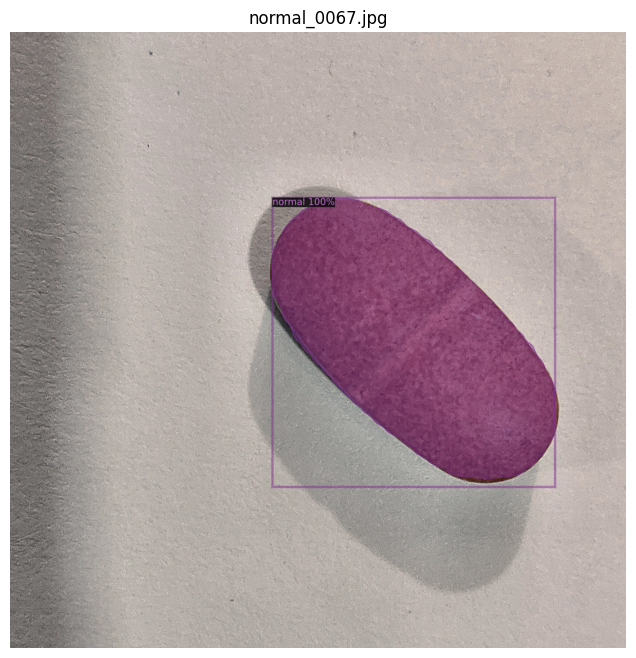

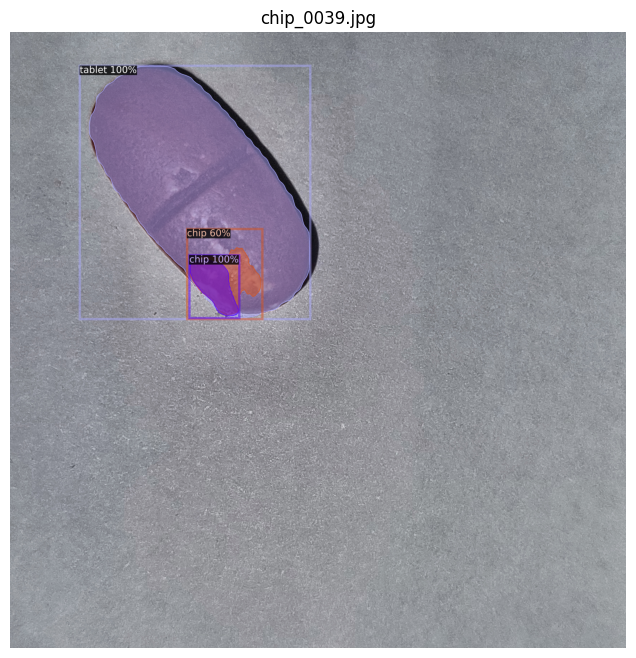

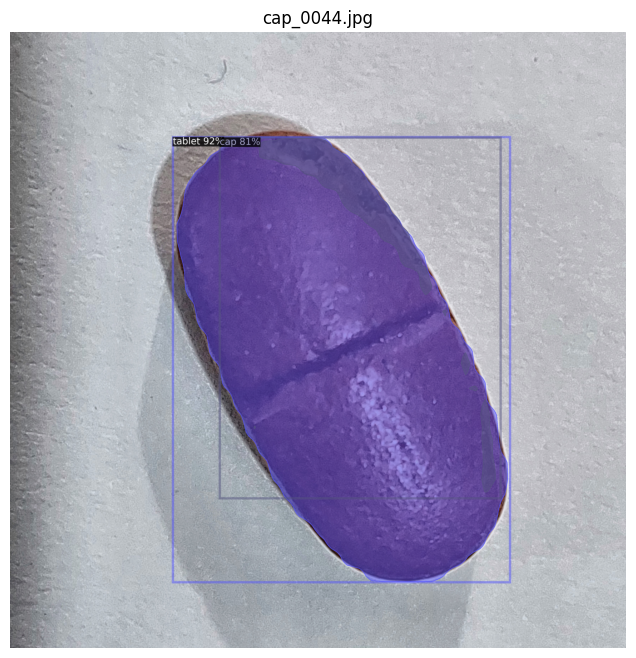

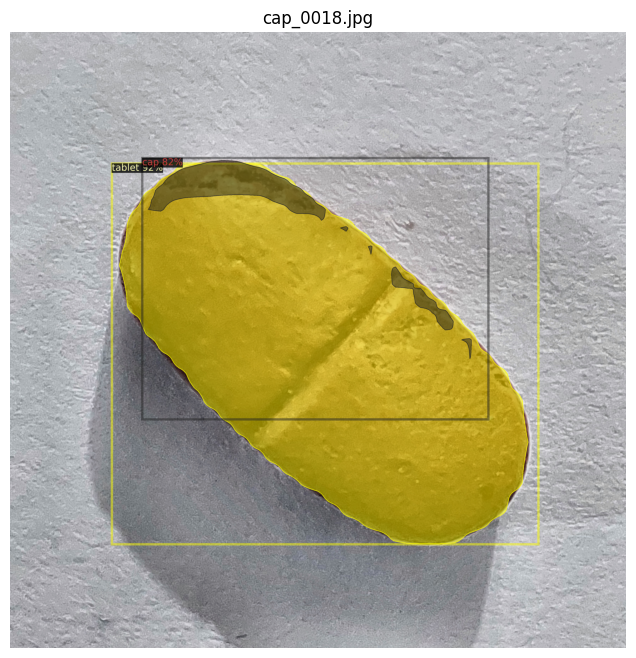

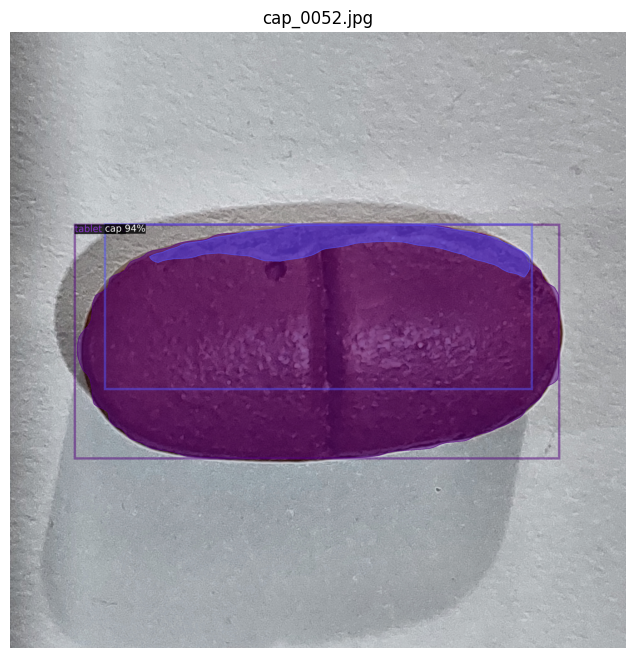

In [ ]:
# =========================================================
# VISUALIZE MASK R-CNN PREDICTIONS ON TEST IMAGES
# =========================================================

import os
import cv2
import random
import matplotlib.pyplot as plt

from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# =========================================================
# SELECT MODEL
# =========================================================

MODEL_PATH = "/content/mask_rcnn_output/model_final.pth"

# change to:
# /content/mask_rcnn_run2/model_final.pth
# /content/mask_rcnn_run3/model_final.pth

# =========================================================
# TEST IMAGES PATH
# =========================================================

TEST_DIR = "/content/FINAL_DATASET/final_dataset/images/test"

# =========================================================
# CONFIG
# =========================================================

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.MODEL.WEIGHTS = MODEL_PATH

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.INPUT.MIN_SIZE_TEST = 1024
cfg.INPUT.MAX_SIZE_TEST = 1024

predictor = DefaultPredictor(cfg)

# =========================================================
# CLASS NAMES
# =========================================================

MetadataCatalog.get("custom_test").thing_classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]

metadata = MetadataCatalog.get("custom_test")

# =========================================================
# RANDOM TEST IMAGES
# =========================================================

test_images = [
    f for f in os.listdir(TEST_DIR)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

random.shuffle(test_images)

# number of images to visualize
NUM_IMAGES = 5

# =========================================================
# VISUALIZATION
# =========================================================

for image_name in test_images[:NUM_IMAGES]:

    image_path = os.path.join(TEST_DIR, image_name)

    img = cv2.imread(image_path)

    outputs = predictor(img)

    instances = outputs["instances"].to("cpu")

    # =====================================================
    # VISUALIZER
    # =====================================================

    v = Visualizer(
        img[:, :, ::-1],
        metadata=metadata,
        scale=1.0
    )

    out = v.draw_instance_predictions(instances)

    result = out.get_image()

    # =====================================================
    # DISPLAY
    # =====================================================

    plt.figure(figsize=(12,8))

    plt.imshow(result)

    plt.title(image_name)

    plt.axis("off")

    plt.show()

[05/17 16:30:33 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_output/model_final.pth ...


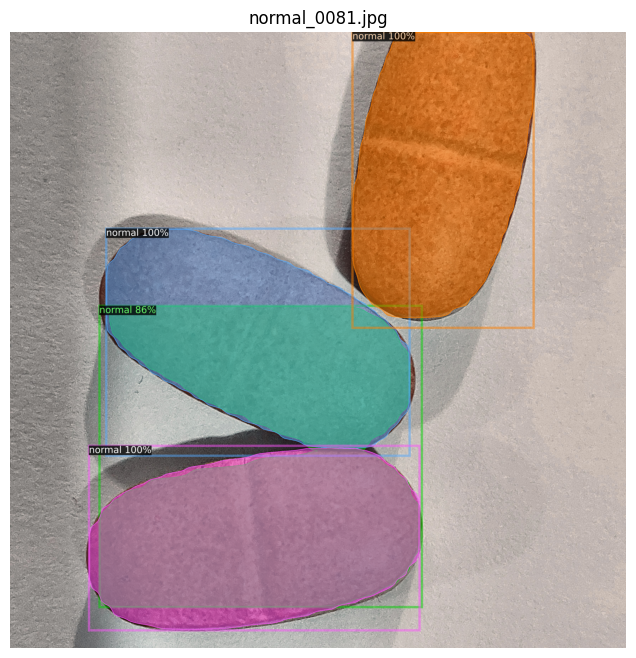

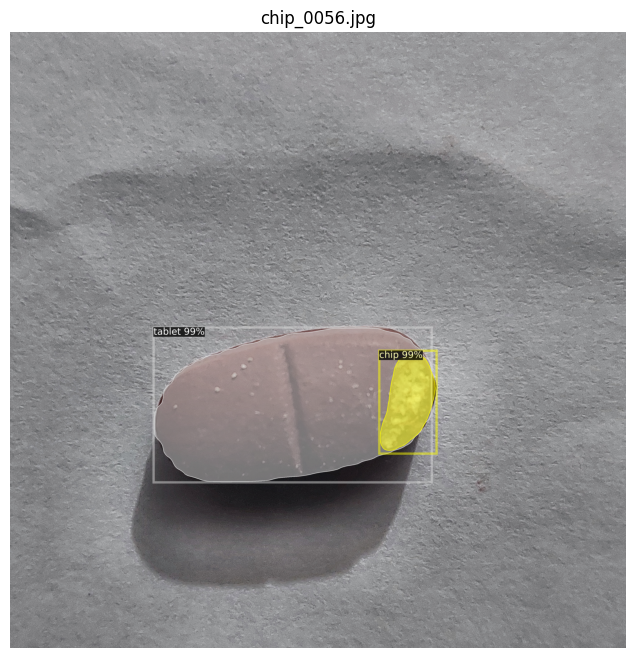

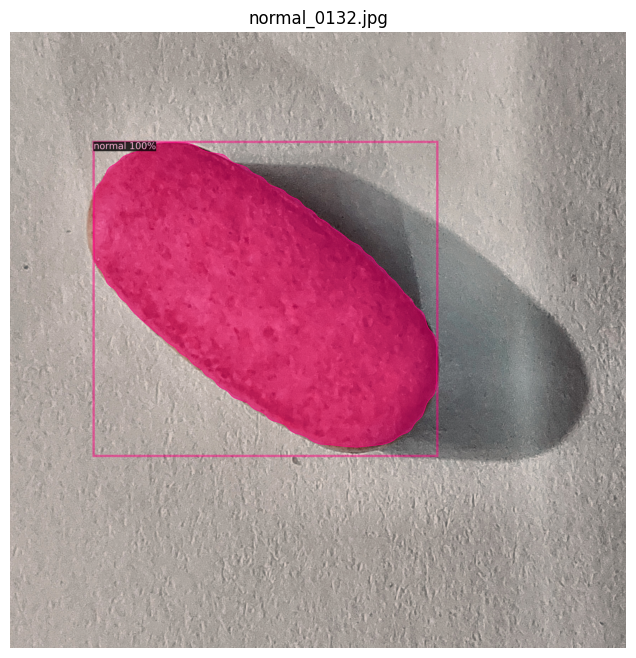

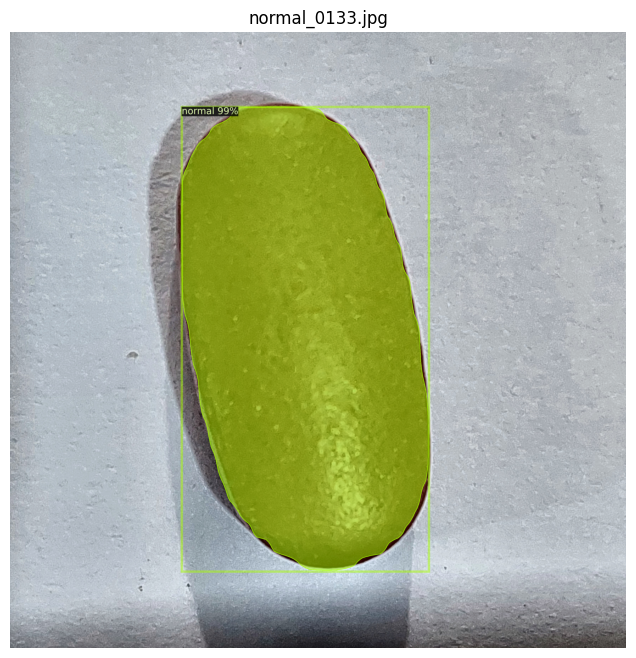

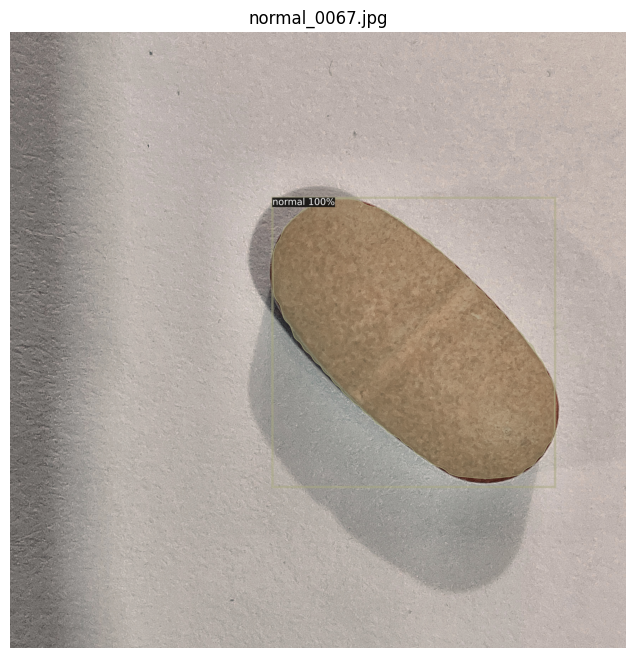

In [ ]:
# =========================================================
# VISUALIZE MASK R-CNN PREDICTIONS ON TEST IMAGES
# =========================================================

import os
import cv2
import random
import matplotlib.pyplot as plt

from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# =========================================================
# SELECT MODEL
# =========================================================

MODEL_PATH = "/content/mask_rcnn_output/model_final.pth"

# change to:
# /content/mask_rcnn_run2/model_final.pth
# /content/mask_rcnn_run3/model_final.pth

# =========================================================
# TEST IMAGES PATH
# =========================================================

TEST_DIR = "/content/FINAL_DATASET/final_dataset/images/test"

# =========================================================
# CONFIG
# =========================================================

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.MODEL.WEIGHTS = MODEL_PATH

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.INPUT.MIN_SIZE_TEST = 1024
cfg.INPUT.MAX_SIZE_TEST = 1024

predictor = DefaultPredictor(cfg)

# =========================================================
# CLASS NAMES
# =========================================================

MetadataCatalog.get("custom_test").thing_classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]

metadata = MetadataCatalog.get("custom_test")

# =========================================================
# RANDOM TEST IMAGES
# =========================================================

test_images = [
    f for f in os.listdir(TEST_DIR)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

random.shuffle(test_images)

# number of images to visualize
NUM_IMAGES = 5

# =========================================================
# VISUALIZATION
# =========================================================

for image_name in test_images[:NUM_IMAGES]:

    image_path = os.path.join(TEST_DIR, image_name)

    img = cv2.imread(image_path)

    outputs = predictor(img)

    instances = outputs["instances"].to("cpu")

    # =====================================================
    # VISUALIZER
    # =====================================================

    v = Visualizer(
        img[:, :, ::-1],
        metadata=metadata,
        scale=1.0
    )

    out = v.draw_instance_predictions(instances)

    result = out.get_image()

    # =====================================================
    # DISPLAY
    # =====================================================

    plt.figure(figsize=(12,8))

    plt.imshow(result)

    plt.title(image_name)

    plt.axis("off")

    plt.show()

[05/17 16:30:47 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run2/model_final.pth ...


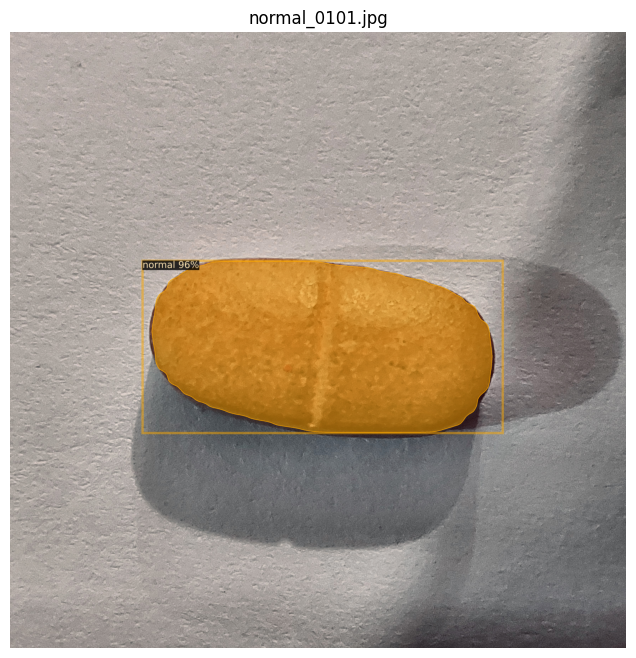

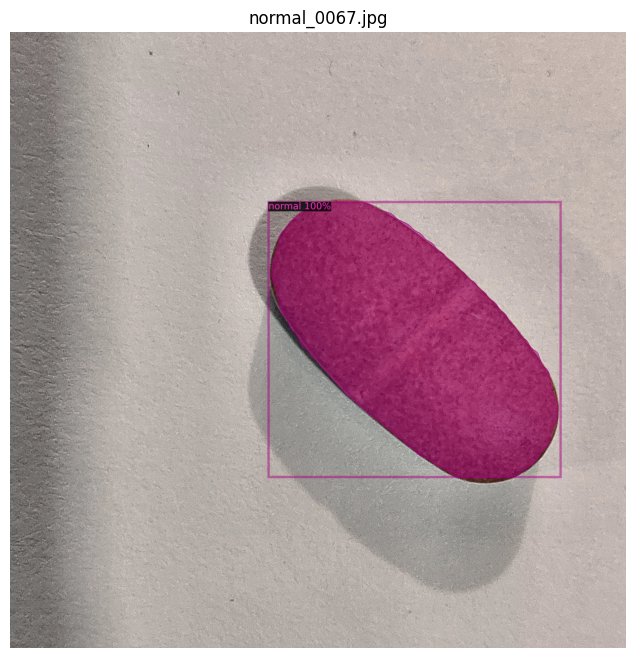

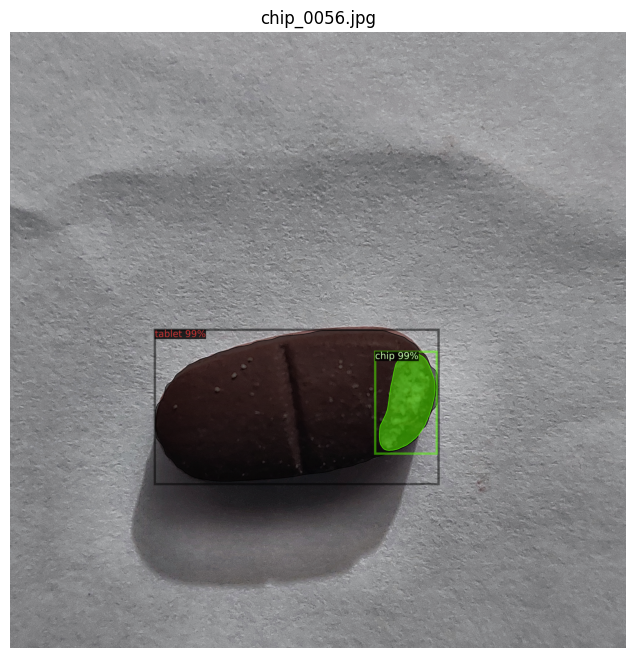

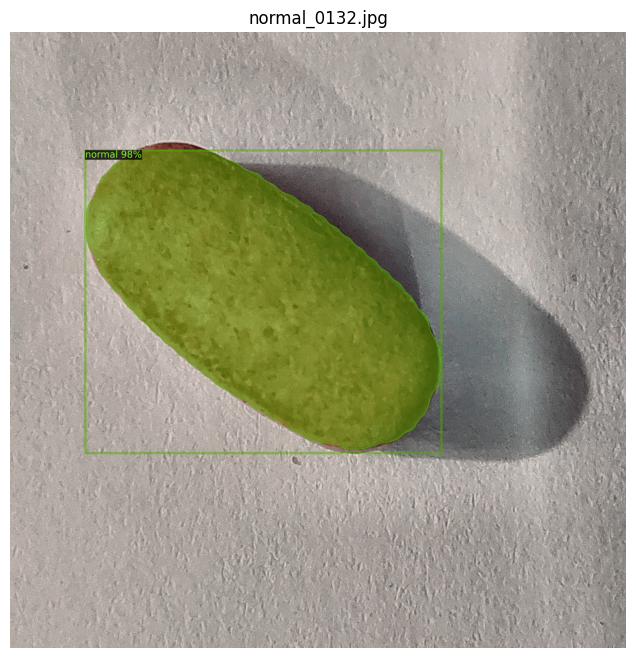

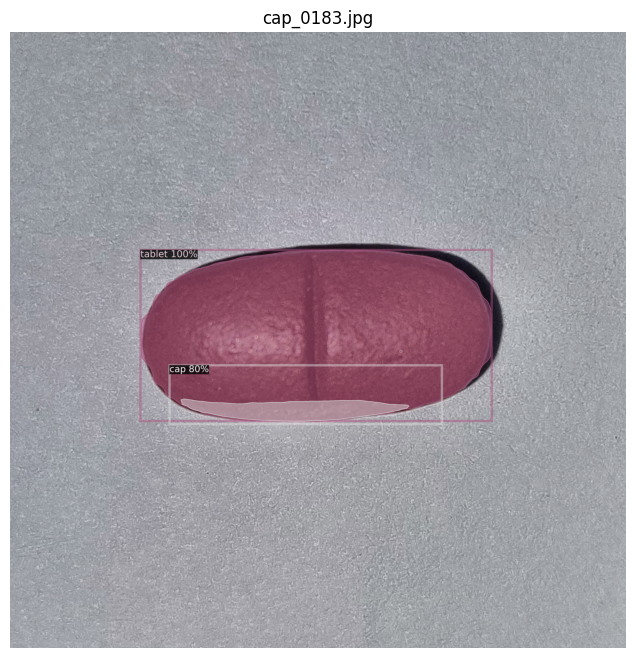

In [ ]:
# =========================================================
# VISUALIZE MASK R-CNN PREDICTIONS ON TEST IMAGES
# =========================================================

import os
import cv2
import random
import matplotlib.pyplot as plt

from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# =========================================================
# SELECT MODEL
# =========================================================

MODEL_PATH = "/content/mask_rcnn_run2/model_final.pth"

# change to:
# /content/mask_rcnn_run2/model_final.pth
# /content/mask_rcnn_run3/model_final.pth

# =========================================================
# TEST IMAGES PATH
# =========================================================

TEST_DIR = "/content/FINAL_DATASET/final_dataset/images/test"

# =========================================================
# CONFIG
# =========================================================

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.MODEL.WEIGHTS = MODEL_PATH

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.INPUT.MIN_SIZE_TEST = 1024
cfg.INPUT.MAX_SIZE_TEST = 1024

predictor = DefaultPredictor(cfg)

# =========================================================
# CLASS NAMES
# =========================================================

MetadataCatalog.get("custom_test").thing_classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]

metadata = MetadataCatalog.get("custom_test")

# =========================================================
# RANDOM TEST IMAGES
# =========================================================

test_images = [
    f for f in os.listdir(TEST_DIR)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

random.shuffle(test_images)

# number of images to visualize
NUM_IMAGES = 5

# =========================================================
# VISUALIZATION
# =========================================================

for image_name in test_images[:NUM_IMAGES]:

    image_path = os.path.join(TEST_DIR, image_name)

    img = cv2.imread(image_path)

    outputs = predictor(img)

    instances = outputs["instances"].to("cpu")

    # =====================================================
    # VISUALIZER
    # =====================================================

    v = Visualizer(
        img[:, :, ::-1],
        metadata=metadata,
        scale=1.0
    )

    out = v.draw_instance_predictions(instances)

    result = out.get_image()

    # =====================================================
    # DISPLAY
    # =====================================================

    plt.figure(figsize=(12,8))

    plt.imshow(result)

    plt.title(image_name)

    plt.axis("off")

    plt.show()

[05/17 16:31:01 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...


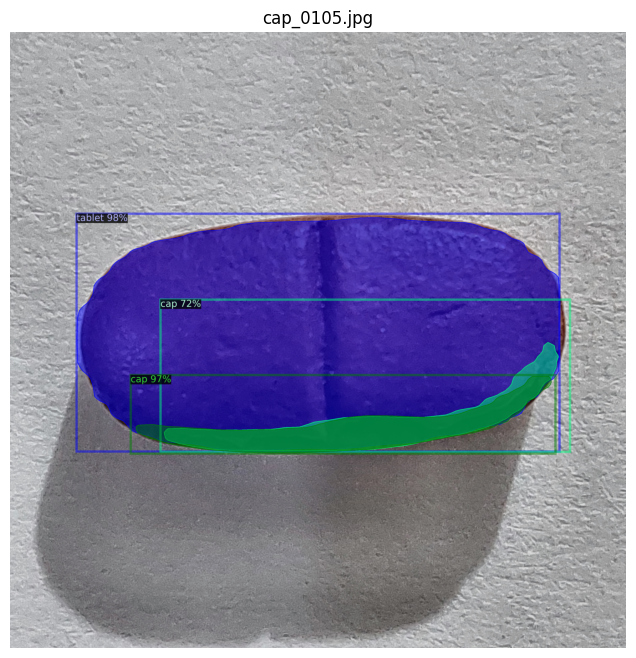

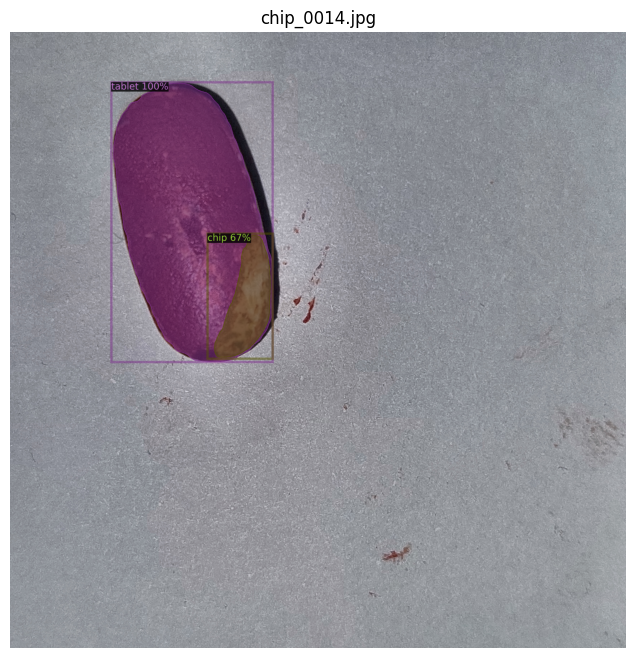

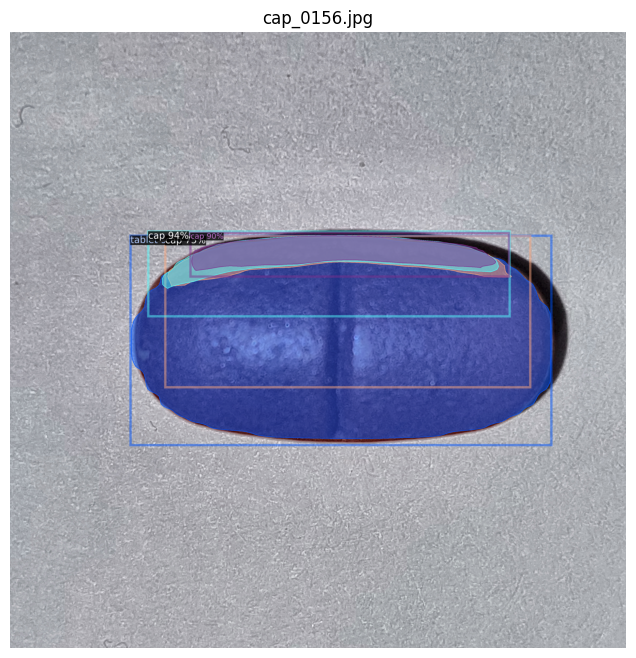

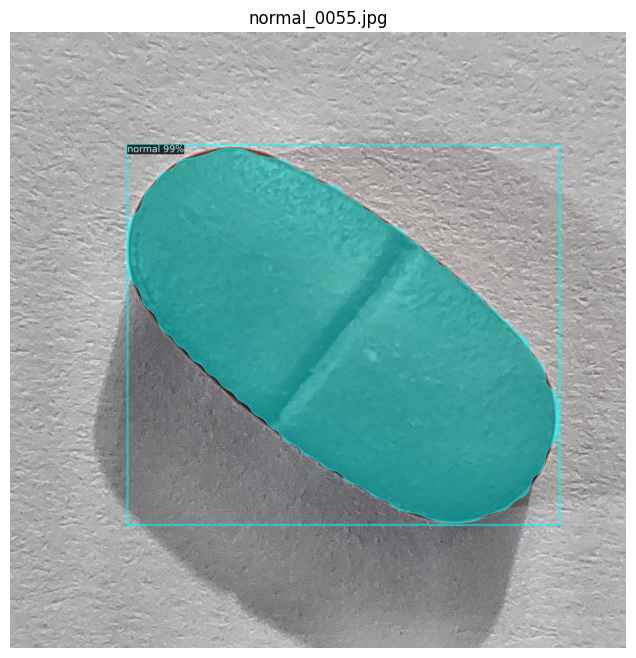

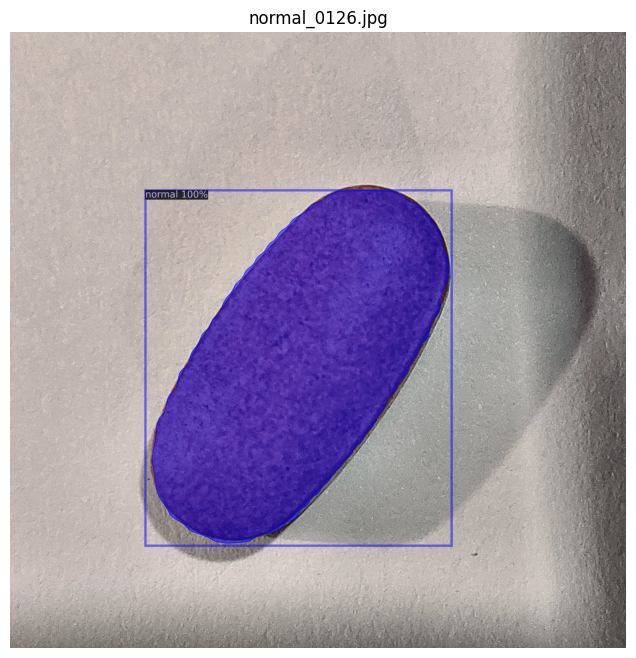

In [ ]:
# =========================================================
# VISUALIZE MASK R-CNN PREDICTIONS ON TEST IMAGES
# =========================================================

import os
import cv2
import random
import matplotlib.pyplot as plt

from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog

# =========================================================
# SELECT MODEL
# =========================================================

MODEL_PATH = "/content/mask_rcnn_run3/model_final.pth"

# change to:
# /content/mask_rcnn_run2/model_final.pth
# /content/mask_rcnn_run3/model_final.pth

# =========================================================
# TEST IMAGES PATH
# =========================================================

TEST_DIR = "/content/FINAL_DATASET/final_dataset/images/test"

# =========================================================
# CONFIG
# =========================================================

cfg = get_cfg()

cfg.merge_from_file(
    model_zoo.get_config_file(
        "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    )
)

cfg.MODEL.WEIGHTS = MODEL_PATH

cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4

cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5

cfg.INPUT.MIN_SIZE_TEST = 1024
cfg.INPUT.MAX_SIZE_TEST = 1024

predictor = DefaultPredictor(cfg)

# =========================================================
# CLASS NAMES
# =========================================================

MetadataCatalog.get("custom_test").thing_classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]

metadata = MetadataCatalog.get("custom_test")

# =========================================================
# RANDOM TEST IMAGES
# =========================================================

test_images = [
    f for f in os.listdir(TEST_DIR)
    if f.lower().endswith((".jpg", ".png", ".jpeg"))
]

random.shuffle(test_images)

# number of images to visualize
NUM_IMAGES = 5

# =========================================================
# VISUALIZATION
# =========================================================

for image_name in test_images[:NUM_IMAGES]:

    image_path = os.path.join(TEST_DIR, image_name)

    img = cv2.imread(image_path)

    outputs = predictor(img)

    instances = outputs["instances"].to("cpu")

    # =====================================================
    # VISUALIZER
    # =====================================================

    v = Visualizer(
        img[:, :, ::-1],
        metadata=metadata,
        scale=1.0
    )

    out = v.draw_instance_predictions(instances)

    result = out.get_image()

    # =====================================================
    # DISPLAY
    # =====================================================

    plt.figure(figsize=(12,8))

    plt.imshow(result)

    plt.title(image_name)

    plt.axis("off")

    plt.show()

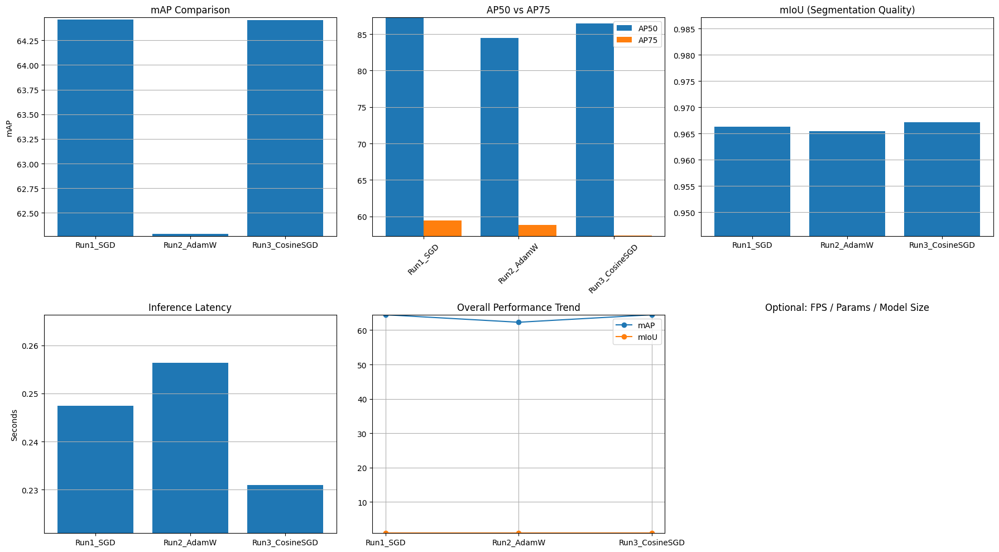

In [ ]:
import matplotlib.pyplot as plt

fig, axes = plt.subplots(2, 3, figsize=(18, 10))

models = df["Model"]

# =========================================================
# 1. mAP
# =========================================================
axes[0, 0].bar(models, df["mAP"])
axes[0, 0].set_title("mAP Comparison")
axes[0, 0].set_ylabel("mAP")
axes[0, 0].grid(axis="y")
axes[0, 0].set_ylim(df["mAP"].min() - 0.02, df["mAP"].max() + 0.02)

# =========================================================
# 2. AP50 vs AP75
# =========================================================
x = range(len(models))

axes[0, 1].bar(x, df["AP50"], width=0.4, label="AP50")
axes[0, 1].bar([i + 0.4 for i in x], df["AP75"], width=0.4, label="AP75")

axes[0, 1].set_xticks([i + 0.2 for i in x])
axes[0, 1].set_xticklabels(models, rotation=45)
axes[0, 1].set_title("AP50 vs AP75")
axes[0, 1].legend()
axes[0, 1].grid(axis="y")

axes[0, 1].set_ylim(
    min(df["AP50"].min(), df["AP75"].min()) - 0.02,
    max(df["AP50"].max(), df["AP75"].max()) + 0.02
)

# =========================================================
# 3. mIoU
# =========================================================
axes[0, 2].bar(models, df["mIoU"])
axes[0, 2].set_title("mIoU (Segmentation Quality)")
axes[0, 2].grid(axis="y")
axes[0, 2].set_ylim(df["mIoU"].min() - 0.02, df["mIoU"].max() + 0.02)

# =========================================================
# 4. Latency
# =========================================================
axes[1, 0].bar(models, df["Latency (s)"])
axes[1, 0].set_title("Inference Latency")
axes[1, 0].set_ylabel("Seconds")
axes[1, 0].grid(axis="y")
axes[1, 0].set_ylim(df["Latency (s)"].min() - 0.01, df["Latency (s)"].max() + 0.01)

# =========================================================
# 5. Combined Score (mAP + mIoU)
# =========================================================
axes[1, 1].plot(models, df["mAP"], marker="o", label="mAP")
axes[1, 1].plot(models, df["mIoU"], marker="o", label="mIoU")

axes[1, 1].set_title("Overall Performance Trend")
axes[1, 1].legend()
axes[1, 1].grid()

axes[1, 1].set_ylim(
    min(df["mAP"].min(), df["mIoU"].min()) - 0.02,
    max(df["mAP"].max(), df["mIoU"].max()) + 0.02
)

# =========================================================
# 6. EMPTY / OPTIONAL SLOT (you can upgrade later)
# =========================================================
axes[1, 2].axis("off")
axes[1, 2].set_title("Optional: FPS / Params / Model Size")

plt.tight_layout()
plt.show()

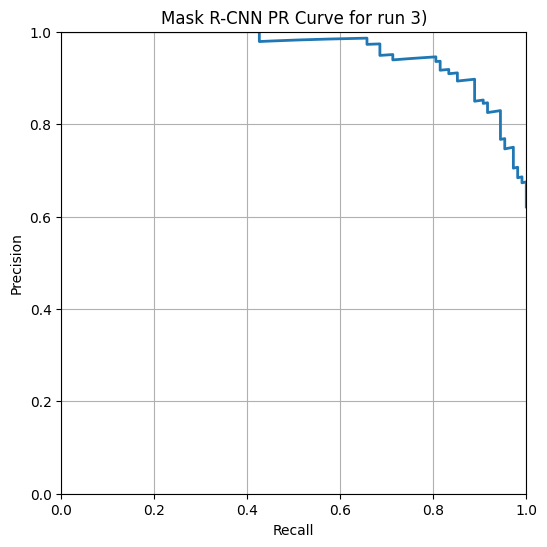

In [ ]:
from sklearn.metrics import precision_recall_curve

iou_threshold = 0.5

y_true = []
y_scores = []

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    gt_boxes = []
    for ann in d["annotations"]:
        seg = ann["segmentation"][0]
        pts = np.array(seg).reshape(-1, 2).astype(np.int32)
        x, y, w, h = cv2.boundingRect(pts)
        gt_boxes.append([x, y, x+w, y+h])

    if len(outputs["instances"]) == 0:
        continue

    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    pred_scores = outputs["instances"].scores.cpu().numpy()

    matched_gt = set()

    for pb, score in zip(pred_boxes, pred_scores):

        best_iou = 0
        best_gt = -1

        for i, gb in enumerate(gt_boxes):

            ix1 = max(pb[0], gb[0])
            iy1 = max(pb[1], gb[1])
            ix2 = min(pb[2], gb[2])
            iy2 = min(pb[3], gb[3])

            inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)

            area_pb = (pb[2]-pb[0]) * (pb[3]-pb[1])
            area_gb = (gb[2]-gb[0]) * (gb[3]-gb[1])

            union = area_pb + area_gb - inter

            iou = inter / union if union > 0 else 0

            if iou > best_iou:
                best_iou = iou
                best_gt = i

        if best_iou >= iou_threshold and best_gt not in matched_gt:
            y_true.append(1)  # TP
            matched_gt.add(best_gt)
        else:
            y_true.append(0)  # FP

        y_scores.append(score)

precision, recall, _ = precision_recall_curve(y_true, y_scores)

plt.figure(figsize=(6,6))
plt.plot(recall, precision, linewidth=2)

plt.xlabel("Recall")
plt.ylabel("Precision")
plt.title("Mask R-CNN PR Curve for run 3)")
plt.grid()
plt.xlim(0,1)
plt.ylim(0,1)

plt.show()

In [ ]:
edge_cases = []

IOU_FAIL_THR = 0.3

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])
    outputs = predictor(img)

    gt_boxes = []
    for ann in d["annotations"]:
        seg = ann["segmentation"][0]
        pts = np.array(seg).reshape(-1, 2).astype(np.int32)
        x, y, w, h = cv2.boundingRect(pts)
        gt_boxes.append([x, y, x+w, y+h])

    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy() if len(outputs["instances"]) else []

    # CASE 1: NO DETECTION
    if len(pred_boxes) == 0 and len(gt_boxes) > 0:
        edge_cases.append((d["file_name"], "No detection (false negative)"))
        continue

    # CASE 2: BAD MATCHING
    best_overall_iou = 0

    for pb in pred_boxes:
        for gb in gt_boxes:

            ix1 = max(pb[0], gb[0])
            iy1 = max(pb[1], gb[1])
            ix2 = min(pb[2], gb[2])
            iy2 = min(pb[3], gb[3])

            inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)

            area_pb = (pb[2]-pb[0]) * (pb[3]-pb[1])
            area_gb = (gb[2]-gb[0]) * (gb[3]-gb[1])

            union = area_pb + area_gb - inter

            iou = inter / union if union > 0 else 0

            best_overall_iou = max(best_overall_iou, iou)

    if best_overall_iou < IOU_FAIL_THR:
        edge_cases.append((d["file_name"], f"Low IoU ({best_overall_iou:.2f})"))

In [ ]:
import matplotlib.pyplot as plt

plt.figure(figsize=(15, 10))

for i, (path, reason) in enumerate(edge_cases[:6]):

    img = cv2.imread(path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i+1)
    plt.imshow(img)
    plt.title(reason)
    plt.axis("off")

plt.tight_layout()
plt.show()

<Figure size 1500x1000 with 0 Axes>

In [ ]:
edge_cases = []

IOU_FAIL_THR = 0.3

for d in dataset_dicts:

    img = cv2.imread(d["file_name"])
    if img is None:
        continue

    outputs = predictor(img)

    # =========================
    # GT BOXES
    # =========================
    gt_boxes = []
    gt_classes = []

    for ann in d["annotations"]:
        seg = ann["segmentation"][0]
        pts = np.array(seg).reshape(-1, 2).astype(np.int32)
        x, y, w, h = cv2.boundingRect(pts)

        gt_boxes.append([x, y, x+w, y+h])
        gt_classes.append(ann["category_id"] - 1)

    # =========================
    # PREDICTIONS
    # =========================
    if len(outputs["instances"]) == 0:

        if len(gt_boxes) > 0:
            edge_cases.append((d["file_name"], "False Negative (no detection)", gt_boxes, []))
        continue

    pred_boxes = outputs["instances"].pred_boxes.tensor.cpu().numpy()
    pred_classes = outputs["instances"].pred_classes.cpu().numpy()

    # =========================
    # CASE 1: NO GT BUT PREDICTED
    # =========================
    if len(gt_boxes) == 0 and len(pred_boxes) > 0:
        edge_cases.append((d["file_name"], "False Positive (no GT)", [], pred_boxes))
        continue

    # =========================
    # CASE 2: IOU EVALUATION
    # =========================
    best_overall_iou = 0
    matched = set()

    for pb in pred_boxes:

        best_iou = 0
        best_gt = -1

        for i, gb in enumerate(gt_boxes):

            ix1 = max(pb[0], gb[0])
            iy1 = max(pb[1], gb[1])
            ix2 = min(pb[2], gb[2])
            iy2 = min(pb[3], gb[3])

            inter = max(0, ix2 - ix1) * max(0, iy2 - iy1)

            area_pb = (pb[2]-pb[0]) * (pb[3]-pb[1])
            area_gb = (gb[2]-gb[0]) * (gb[3]-gb[1])

            union = area_pb + area_gb - inter

            iou = inter / union if union > 0 else 0

            if iou > best_iou:
                best_iou = iou
                best_gt = i

        best_overall_iou = max(best_overall_iou, best_iou)

        # mark match
        if best_iou >= IOU_FAIL_THR:
            matched.add(best_gt)

    # =========================
    # CASE 3: FAILURE CONDITIONS
    # =========================

    if best_overall_iou < IOU_FAIL_THR:
        edge_cases.append((d["file_name"], f"Low IoU ({best_overall_iou:.2f})", gt_boxes, pred_boxes))

    if len(matched) < len(gt_boxes):
        edge_cases.append((d["file_name"], "Missed objects (partial detection)", gt_boxes, pred_boxes))

[05/17 17:04:34 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...
[05/17 17:04:36 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...
[05/17 17:04:39 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...
[05/17 17:04:42 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...
[05/17 17:04:44 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...
[05/17 17:04:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /content/mask_rcnn_run3/model_final.pth ...


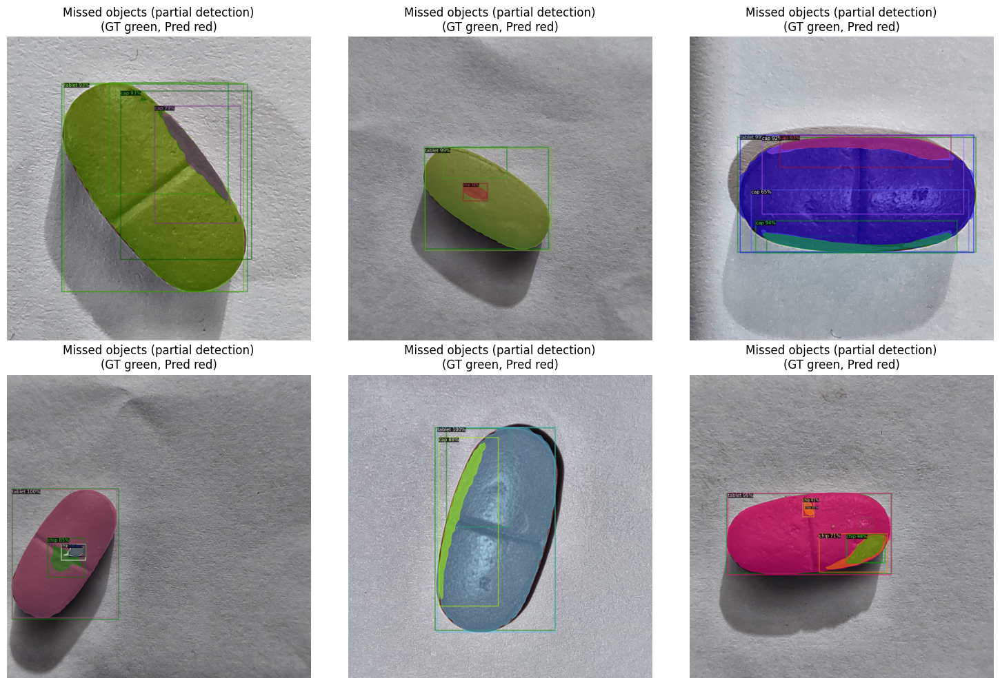

In [ ]:
import matplotlib.pyplot as plt
import cv2
from detectron2.utils.visualizer import Visualizer, ColorMode
from detectron2.data import MetadataCatalog
from detectron2.config import get_cfg
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor


MetadataCatalog.get("custom_test").thing_classes = [
    "tablet",
    "chip",
    "cap",
    "normal"
]
metadata = MetadataCatalog.get("custom_test")

if len(edge_cases) == 0:
    print("No edge cases found")
else:

    plt.figure(figsize=(15, 10))

    shown = 0

    for ec in edge_cases:
        image_path = ec[0]
        reason_text = ec[1]
        gt_boxes = ec[2]
        pred_instances_info = ec[3]

        img = cv2.imread(image_path)

        if img is None:
            continue

        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

        # Initialize Visualizer
        v = Visualizer(img_rgb, metadata=metadata, scale=1.0, instance_mode=ColorMode.SEGMENTATION)

        # Draw Ground Truth boxes in green
        for gt_box in gt_boxes:
            x1, y1, x2, y2 = map(int, gt_box)
            # Visualizer expects (x_min, y_min, x_max, y_max) or polygon
            v.draw_box([x1, y1, x2, y2], edge_color='green')

        cfg_viz = get_cfg()
        cfg_viz.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
        cfg_viz.MODEL.WEIGHTS = "/content/mask_rcnn_run3/model_final.pth" # Run3_CosineSGD (Corrected path)
        cfg_viz.MODEL.ROI_HEADS.NUM_CLASSES = 4
        cfg_viz.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
        cfg_viz.INPUT.MIN_SIZE_TEST = 1024
        cfg_viz.INPUT.MAX_SIZE_TEST = 1024
        predictor_run3 = DefaultPredictor(cfg_viz)

        outputs_run3 = predictor_run3(img)
        instances_run3 = outputs_run3["instances"].to("cpu")

        out = v.draw_instance_predictions(instances_run3)
        result = out.get_image()

        plt.subplot(2, 3, shown + 1)
        plt.imshow(result)
        plt.title(f"{reason_text}\n(GT green, Pred red)")
        plt.axis("off")

        shown += 1

        if shown == 6:
            break

    plt.tight_layout()
    plt.show()

### Inferences from Edge Case Analysis

The edge case analysis, focusing on scenarios where the model struggled, reveals several common patterns:

*   **False Negatives (No Detection)**: The model completely missed objects that were present in the ground truth. This indicates a failure to detect the presence of certain defects or items. (e.g., `'No detection (false negative)'`)


*   **Missed Objects (Partial Detection)**: In images containing multiple objects, the model only detected a subset of them, missing some ground truth instances. This can happen if objects are small, occluded, or visually similar to the background. (e.g., `'Missed objects (partial detection)'`)

These categories highlight areas where the model's performance can be improved, either through better feature extraction for detection, more robust localization, or enhanced instance segmentation to differentiate between closely spaced objects.